In [ ]:
# flowers_colorization_gan.py

import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.datasets import Flowers102
from torchvision.utils import make_grid
from torchvision import models
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb
from skimage import img_as_ubyte
from tqdm import tqdm

# Check for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


Using device: cuda


In [ ]:
!wget http://www.robots.ox.ac.uk/~vgg/data/flowers/102/102flowers.tgz

URL transformed to HTTPS due to an HSTS policy
--2025-06-22 23:14:19--  https://www.robots.ox.ac.uk/~vgg/data/flowers/102/102flowers.tgz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://thor.robots.ox.ac.uk/flowers/102/102flowers.tgz [following]
--2025-06-22 23:14:20--  https://thor.robots.ox.ac.uk/flowers/102/102flowers.tgz
Resolving thor.robots.ox.ac.uk (thor.robots.ox.ac.uk)... ^C


In [ ]:
!tar -xvzf 102flowers.tgz

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
jpg/image_02266.jpg
jpg/image_00062.jpg
jpg/image_05821.jpg
jpg/image_03712.jpg
jpg/image_01142.jpg
jpg/image_03033.jpg
jpg/image_05760.jpg
jpg/image_02732.jpg
jpg/image_00183.jpg
jpg/image_05264.jpg
jpg/image_03778.jpg
jpg/image_07061.jpg
jpg/image_04468.jpg
jpg/image_00676.jpg
jpg/image_07610.jpg
jpg/image_02192.jpg
jpg/image_05112.jpg
jpg/image_05638.jpg
jpg/image_00053.jpg
jpg/image_02451.jpg
jpg/image_05857.jpg
jpg/image_08033.jpg
jpg/image_03902.jpg
jpg/image_07494.jpg
jpg/image_02357.jpg
jpg/image_05496.jpg
jpg/image_04496.jpg
jpg/image_07538.jpg
jpg/image_01801.jpg
jpg/image_00326.jpg
jpg/image_07644.jpg
jpg/image_01199.jpg
jpg/image_01168.jpg
jpg/image_07020.jpg
jpg/image_05006.jpg
jpg/image_03484.jpg
jpg/image_02825.jpg
jpg/image_04549.jpg
jpg/image_02011.jpg
jpg/image_04360.jpg
jpg/image_06847.jpg
jpg/image_07695.jpg
jpg/image_03540.jpg
jpg/image_08058.jpg
jpg/image_01230.jpg
jpg/image_00096.jpg
jp

In [ ]:
import os
import numpy as np
from PIL import Image
from skimage.color import rgb2lab
import torch
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms as T

class Flowers102ColorizationDataset(Dataset):
    def __init__(self, image_dir, image_size=128, augment=False):
        self.image_dir = image_dir
        self.image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.jpg')])
        self.image_size = image_size
        self.augment = augment

        # Define transforms
        self.transform = T.Compose([
            T.Resize((image_size, image_size)),
            T.RandomHorizontalFlip(p=0.5) if augment else T.Lambda(lambda x: x),
            T.RandomRotation(15) if augment else T.Lambda(lambda x: x),
        ])

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        img = Image.open(img_path).convert("RGB")
        img = self.transform(img)
        img = np.array(img) / 255.0

        # Convert to LAB
        lab = rgb2lab(img).astype("float32")
        lab = lab / [100.0, 128.0, 128.0]  # Normalize

        L = lab[:, :, 0:1]
        ab = lab[:, :, 1:]

        L_tensor = torch.from_numpy(L).permute(2, 0, 1).float()
        ab_tensor = torch.from_numpy(ab).permute(2, 0, 1).float()

        return L_tensor, ab_tensor


In [ ]:
dataset = Flowers102ColorizationDataset("/content/jpg", image_size=128)

In [ ]:
from tqdm import tqdm

def get_dataloaders(folder_path, image_size=128, batch_size=16, train_ratio=0.8, val_ratio=0.1):
    print("Loading full dataset...")
    full_dataset = Flowers102ColorizationDataset(folder_path, image_size=image_size, augment=True)

    total = len(full_dataset)
    train_size = int(train_ratio * total)
    val_size = int(val_ratio * total)
    test_size = total - train_size - val_size

    print(f"Splitting: {train_size} train | {val_size} val | {test_size} test")

    train_ds, val_ds, test_ds = random_split(full_dataset, [train_size, val_size, test_size])

    # Turn off augmentation for val/test
    val_ds.dataset.augment = False
    test_ds.dataset.augment = False

    print("Creating dataloaders...")

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader


In [ ]:
# Part 3: Generator Network

class ColorizationGenerator(nn.Module):
    def __init__(self, pretrained=True):
        super(ColorizationGenerator, self).__init__()

        # Use pretrained ResNet18 as encoder
        resnet = models.resnet18(pretrained=pretrained)

        # Modify first conv layer to accept 1 channel (L instead of RGB)
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False),  # Modified input
            resnet.bn1,
            resnet.relu,
            resnet.maxpool,
            resnet.layer1,
            resnet.layer2,
            resnet.layer3,
            resnet.layer4,
        )

        # Decoder: upsample and reduce to 2 channels (ab)
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),  # -> 8x8
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # -> 16x16
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),   # -> 32x32
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),    # -> 64x64
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(32, 16, kernel_size=4, stride=2, padding=1),    # -> 128x128
            nn.ReLU(inplace=True),
            nn.Conv2d(16, 2, kernel_size=1),  # Final output: 2 channels (ab)
            nn.Tanh()  # Because ab was normalized to [-1, 1]
        )

    def forward(self, L):
        features = self.encoder(L)  # Encode grayscale image
        ab = self.decoder(features)  # Decode to predict ab
        return ab


In [ ]:
# Part 4: Discriminator Network

class ColorizationDiscriminator(nn.Module):
    def __init__(self):
        super(ColorizationDiscriminator, self).__init__()

        self.net = nn.Sequential(
            # Input: 3 channels (L=1 + ab=2) -> total 3 channels
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),  # 128 -> 64
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 64 -> 32
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # 32 -> 16
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),  # 16 -> 8
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1),  # -> 7x7 map
            nn.Sigmoid()  # Outputs values in [0,1] for real/fake classification
        )

    def forward(self, L, ab):
        x = torch.cat([L, ab], dim=1)  # Concatenate along channel dimension
        return self.net(x)


In [ ]:
# Part 5: Losses and Optimizers

# L1 loss: measures pixel difference between predicted ab and real ab
reconstruction_loss = nn.L1Loss()

# GAN loss: Binary Cross Entropy (used for real/fake classification)
adversarial_loss = nn.BCELoss()

# Instantiate generator and discriminator
generator = ColorizationGenerator().to(device)
discriminator = ColorizationDiscriminator().to(device)

# Optimizers (Adam is commonly used for GANs)
lr = 2e-4
beta1 = 0.5  # standard GAN setting
beta2 = 0.999

g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, beta2))


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
def train_gan(generator, discriminator, train_loader, val_loader,
              g_optimizer, d_optimizer,
              reconstruction_loss, adversarial_loss,
              epochs=20, lambda_l1=100):

    generator.train()
    discriminator.train()

    history = {'g_total': [], 'g_l1': [], 'g_gan': [], 'd': []}

    for epoch in range(epochs):
        g_total, g_l1, g_gan, d_total = 0, 0, 0, 0

        for L, ab in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            L, ab = L.to(device), ab.to(device)

            # ---------------------
            #  Train Discriminator
            # ---------------------
            with torch.no_grad():
                fake_ab = generator(L)
            real_preds = discriminator(L, ab)
            fake_preds = discriminator(L, fake_ab.detach())

            real_labels = torch.ones_like(real_preds)
            fake_labels = torch.zeros_like(fake_preds)

            d_loss_real = adversarial_loss(real_preds, real_labels)
            d_loss_fake = adversarial_loss(fake_preds, fake_labels)
            d_loss = 0.5 * (d_loss_real + d_loss_fake)

            d_optimizer.zero_grad()
            d_loss.backward()
            d_optimizer.step()


            # ---------------------
            #  Train Generator
            # ---------------------
            fake_ab = generator(L)
            fake_preds = discriminator(L, fake_ab)

            g_gan_loss = adversarial_loss(fake_preds, real_labels)
            g_l1_loss = reconstruction_loss(fake_ab, ab)
            g_loss = g_gan_loss + lambda_l1 * g_l1_loss

            g_optimizer.zero_grad()
            g_loss.backward()
            g_optimizer.step()

            g_total += g_loss.item()
            g_l1 += g_l1_loss.item()
            g_gan += g_gan_loss.item()
            d_total += d_loss.item()

        # Epoch summary
        batches = len(train_loader)
        history['g_total'].append(g_total / batches)
        history['g_l1'].append(g_l1 / batches)
        history['g_gan'].append(g_gan / batches)
        history['d'].append(d_total / batches)

        print(f"[Epoch {epoch+1}] G_loss: {g_total:.2f} (L1: {g_l1:.2f}, GAN: {g_gan:.2f}), D_loss: {d_total:.2f}")

    return history


In [ ]:
train_loader, val_loader, test_loader = get_dataloaders("/content/jpg", image_size=128, batch_size=16)


Loading full dataset...
Splitting: 6551 train | 818 val | 820 test
Creating dataloaders...


In [ ]:
# Instantiate models
generator = ColorizationGenerator().to(device)
discriminator = ColorizationDiscriminator().to(device)

# Optimizers
g_optimizer = torch.optim.Adam(generator.parameters(), lr=2e-4, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=2e-4, betas=(0.5, 0.999))

# Losses
reconstruction_loss = nn.L1Loss()
adversarial_loss = nn.BCELoss()

# Train
history = train_gan(generator, discriminator, train_loader, val_loader,
                    g_optimizer, d_optimizer,
                    reconstruction_loss, adversarial_loss,
                    epochs=100, lambda_l1=100)


Epoch 1/100: 100%|██████████| 410/410 [00:52<00:00,  7.75it/s]


[Epoch 1] G_loss: 7260.64 (L1: 61.21, GAN: 1139.58), D_loss: 109.47


Epoch 2/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 2] G_loss: 7571.59 (L1: 60.47, GAN: 1524.63), D_loss: 67.32


Epoch 3/100: 100%|██████████| 410/410 [00:52<00:00,  7.86it/s]


[Epoch 3] G_loss: 7895.31 (L1: 59.73, GAN: 1922.27), D_loss: 41.62


Epoch 4/100: 100%|██████████| 410/410 [00:52<00:00,  7.86it/s]


[Epoch 4] G_loss: 7672.91 (L1: 57.53, GAN: 1920.36), D_loss: 38.28


Epoch 5/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 5] G_loss: 7878.49 (L1: 56.77, GAN: 2201.30), D_loss: 32.55


Epoch 6/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 6] G_loss: 7911.68 (L1: 56.32, GAN: 2279.38), D_loss: 20.04


Epoch 7/100: 100%|██████████| 410/410 [00:52<00:00,  7.86it/s]


[Epoch 7] G_loss: 7751.50 (L1: 56.30, GAN: 2121.62), D_loss: 50.10


Epoch 8/100: 100%|██████████| 410/410 [00:52<00:00,  7.88it/s]


[Epoch 8] G_loss: 7742.17 (L1: 55.45, GAN: 2197.14), D_loss: 24.10


Epoch 9/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 9] G_loss: 7913.47 (L1: 55.20, GAN: 2393.14), D_loss: 22.96


Epoch 10/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 10] G_loss: 7971.97 (L1: 55.22, GAN: 2450.38), D_loss: 24.13


Epoch 11/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 11] G_loss: 7945.49 (L1: 54.37, GAN: 2508.25), D_loss: 19.95


Epoch 12/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 12] G_loss: 7890.58 (L1: 53.77, GAN: 2513.58), D_loss: 34.52


Epoch 13/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 13] G_loss: 7656.17 (L1: 52.55, GAN: 2400.89), D_loss: 23.46


Epoch 14/100: 100%|██████████| 410/410 [00:52<00:00,  7.86it/s]


[Epoch 14] G_loss: 8000.57 (L1: 52.50, GAN: 2750.63), D_loss: 15.54


Epoch 15/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 15] G_loss: 7512.72 (L1: 52.19, GAN: 2293.46), D_loss: 37.07


Epoch 16/100: 100%|██████████| 410/410 [00:52<00:00,  7.88it/s]


[Epoch 16] G_loss: 7615.49 (L1: 51.07, GAN: 2508.56), D_loss: 17.30


Epoch 17/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 17] G_loss: 7667.04 (L1: 50.48, GAN: 2619.40), D_loss: 15.73


Epoch 18/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 18] G_loss: 8013.10 (L1: 52.62, GAN: 2751.29), D_loss: 16.80


Epoch 19/100: 100%|██████████| 410/410 [00:52<00:00,  7.86it/s]


[Epoch 19] G_loss: 7880.88 (L1: 51.43, GAN: 2737.59), D_loss: 11.86


Epoch 20/100: 100%|██████████| 410/410 [00:51<00:00,  7.91it/s]


[Epoch 20] G_loss: 8061.74 (L1: 51.80, GAN: 2881.73), D_loss: 26.30


Epoch 21/100: 100%|██████████| 410/410 [00:52<00:00,  7.88it/s]


[Epoch 21] G_loss: 7673.77 (L1: 50.67, GAN: 2606.40), D_loss: 10.26


Epoch 22/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 22] G_loss: 7830.69 (L1: 50.64, GAN: 2767.15), D_loss: 13.58


Epoch 23/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 23] G_loss: 7866.37 (L1: 49.76, GAN: 2890.26), D_loss: 10.20


Epoch 24/100: 100%|██████████| 410/410 [00:52<00:00,  7.88it/s]


[Epoch 24] G_loss: 7528.39 (L1: 48.83, GAN: 2644.92), D_loss: 31.37


Epoch 25/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 25] G_loss: 7693.58 (L1: 48.89, GAN: 2804.69), D_loss: 6.05


Epoch 26/100: 100%|██████████| 410/410 [00:52<00:00,  7.84it/s]


[Epoch 26] G_loss: 7788.45 (L1: 49.34, GAN: 2854.94), D_loss: 23.70


Epoch 27/100: 100%|██████████| 410/410 [00:52<00:00,  7.88it/s]


[Epoch 27] G_loss: 7794.94 (L1: 49.36, GAN: 2858.75), D_loss: 8.07


Epoch 28/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 28] G_loss: 7617.06 (L1: 47.91, GAN: 2825.86), D_loss: 23.89


Epoch 29/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 29] G_loss: 7472.97 (L1: 47.21, GAN: 2752.08), D_loss: 8.06


Epoch 30/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 30] G_loss: 8127.74 (L1: 49.53, GAN: 3174.45), D_loss: 0.84


Epoch 31/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 31] G_loss: 7966.37 (L1: 50.34, GAN: 2932.86), D_loss: 26.96


Epoch 32/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 32] G_loss: 7666.43 (L1: 48.94, GAN: 2772.10), D_loss: 16.34


Epoch 33/100: 100%|██████████| 410/410 [00:52<00:00,  7.85it/s]


[Epoch 33] G_loss: 7441.87 (L1: 48.60, GAN: 2581.84), D_loss: 14.88


Epoch 34/100: 100%|██████████| 410/410 [00:52<00:00,  7.85it/s]


[Epoch 34] G_loss: 7812.92 (L1: 47.29, GAN: 3083.68), D_loss: 11.93


Epoch 35/100: 100%|██████████| 410/410 [00:52<00:00,  7.85it/s]


[Epoch 35] G_loss: 7444.71 (L1: 46.76, GAN: 2768.35), D_loss: 14.41


Epoch 36/100: 100%|██████████| 410/410 [00:51<00:00,  7.91it/s]


[Epoch 36] G_loss: 7721.41 (L1: 47.47, GAN: 2974.38), D_loss: 14.50


Epoch 37/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 37] G_loss: 7426.39 (L1: 45.92, GAN: 2834.79), D_loss: 9.44


Epoch 38/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 38] G_loss: 7884.15 (L1: 47.72, GAN: 3112.60), D_loss: 4.04


Epoch 39/100: 100%|██████████| 410/410 [00:52<00:00,  7.82it/s]


[Epoch 39] G_loss: 7189.64 (L1: 45.51, GAN: 2638.48), D_loss: 21.68


Epoch 40/100: 100%|██████████| 410/410 [00:52<00:00,  7.82it/s]


[Epoch 40] G_loss: 7816.38 (L1: 46.64, GAN: 3152.41), D_loss: 1.07


Epoch 41/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 41] G_loss: 7457.78 (L1: 46.54, GAN: 2803.65), D_loss: 18.14


Epoch 42/100: 100%|██████████| 410/410 [00:51<00:00,  7.91it/s]


[Epoch 42] G_loss: 8077.53 (L1: 49.46, GAN: 3132.00), D_loss: 6.25


Epoch 43/100: 100%|██████████| 410/410 [00:52<00:00,  7.88it/s]


[Epoch 43] G_loss: 7172.56 (L1: 45.11, GAN: 2661.12), D_loss: 24.01


Epoch 44/100: 100%|██████████| 410/410 [00:52<00:00,  7.86it/s]


[Epoch 44] G_loss: 7736.59 (L1: 46.98, GAN: 3038.57), D_loss: 7.45


Epoch 45/100: 100%|██████████| 410/410 [00:51<00:00,  7.91it/s]


[Epoch 45] G_loss: 7629.81 (L1: 45.20, GAN: 3110.14), D_loss: 10.05


Epoch 46/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 46] G_loss: 8011.40 (L1: 45.62, GAN: 3449.77), D_loss: 1.04


Epoch 47/100: 100%|██████████| 410/410 [00:52<00:00,  7.88it/s]


[Epoch 47] G_loss: 7686.42 (L1: 47.70, GAN: 2916.58), D_loss: 54.22


Epoch 48/100: 100%|██████████| 410/410 [00:52<00:00,  7.86it/s]


[Epoch 48] G_loss: 6871.52 (L1: 44.99, GAN: 2372.84), D_loss: 32.55


Epoch 49/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 49] G_loss: 7259.09 (L1: 45.40, GAN: 2719.27), D_loss: 12.55


Epoch 50/100: 100%|██████████| 410/410 [00:51<00:00,  7.91it/s]


[Epoch 50] G_loss: 7706.20 (L1: 46.33, GAN: 3073.62), D_loss: 1.44


Epoch 51/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 51] G_loss: 7599.74 (L1: 45.59, GAN: 3040.73), D_loss: 5.50


Epoch 52/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 52] G_loss: 7797.79 (L1: 46.71, GAN: 3126.58), D_loss: 14.93


Epoch 53/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 53] G_loss: 7803.17 (L1: 46.90, GAN: 3112.81), D_loss: 8.68


Epoch 54/100: 100%|██████████| 410/410 [00:52<00:00,  7.88it/s]


[Epoch 54] G_loss: 7655.93 (L1: 45.73, GAN: 3083.10), D_loss: 2.68


Epoch 55/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 55] G_loss: 7568.42 (L1: 45.07, GAN: 3060.97), D_loss: 18.93


Epoch 56/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 56] G_loss: 7677.15 (L1: 46.61, GAN: 3016.35), D_loss: 3.45


Epoch 57/100: 100%|██████████| 410/410 [00:51<00:00,  7.93it/s]


[Epoch 57] G_loss: 7511.37 (L1: 45.00, GAN: 3011.68), D_loss: 13.56


Epoch 58/100: 100%|██████████| 410/410 [00:51<00:00,  7.93it/s]


[Epoch 58] G_loss: 7772.49 (L1: 46.76, GAN: 3096.57), D_loss: 4.93


Epoch 59/100: 100%|██████████| 410/410 [00:51<00:00,  7.93it/s]


[Epoch 59] G_loss: 7698.15 (L1: 43.89, GAN: 3308.93), D_loss: 14.09


Epoch 60/100: 100%|██████████| 410/410 [00:51<00:00,  7.92it/s]


[Epoch 60] G_loss: 7205.04 (L1: 43.96, GAN: 2809.21), D_loss: 12.05


Epoch 61/100: 100%|██████████| 410/410 [00:51<00:00,  7.91it/s]


[Epoch 61] G_loss: 7491.49 (L1: 44.85, GAN: 3006.08), D_loss: 7.32


Epoch 62/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 62] G_loss: 7381.07 (L1: 43.30, GAN: 3051.47), D_loss: 12.39


Epoch 63/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 63] G_loss: 7628.34 (L1: 43.23, GAN: 3305.04), D_loss: 1.90


Epoch 64/100: 100%|██████████| 410/410 [00:52<00:00,  7.82it/s]


[Epoch 64] G_loss: 7745.75 (L1: 42.70, GAN: 3476.17), D_loss: 1.10


Epoch 65/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 65] G_loss: 7953.82 (L1: 44.25, GAN: 3528.71), D_loss: 1.43


Epoch 66/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 66] G_loss: 7496.11 (L1: 45.02, GAN: 2993.76), D_loss: 19.22


Epoch 67/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 67] G_loss: 7562.89 (L1: 43.34, GAN: 3229.00), D_loss: 1.15


Epoch 68/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 68] G_loss: 7692.16 (L1: 43.15, GAN: 3376.88), D_loss: 4.29


Epoch 69/100: 100%|██████████| 410/410 [00:51<00:00,  7.92it/s]


[Epoch 69] G_loss: 6945.51 (L1: 42.75, GAN: 2670.43), D_loss: 44.44


Epoch 70/100: 100%|██████████| 410/410 [00:52<00:00,  7.85it/s]


[Epoch 70] G_loss: 7762.33 (L1: 44.87, GAN: 3275.64), D_loss: 4.80


Epoch 71/100: 100%|██████████| 410/410 [00:52<00:00,  7.86it/s]


[Epoch 71] G_loss: 7839.94 (L1: 43.58, GAN: 3481.62), D_loss: 2.06


Epoch 72/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 72] G_loss: 7486.89 (L1: 42.91, GAN: 3196.25), D_loss: 14.56


Epoch 73/100: 100%|██████████| 410/410 [00:52<00:00,  7.86it/s]


[Epoch 73] G_loss: 7630.37 (L1: 42.66, GAN: 3364.05), D_loss: 3.04


Epoch 74/100: 100%|██████████| 410/410 [00:52<00:00,  7.88it/s]


[Epoch 74] G_loss: 7469.90 (L1: 42.21, GAN: 3248.46), D_loss: 2.95


Epoch 75/100: 100%|██████████| 410/410 [00:51<00:00,  7.92it/s]


[Epoch 75] G_loss: 7596.20 (L1: 43.12, GAN: 3284.10), D_loss: 11.32


Epoch 76/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 76] G_loss: 7263.82 (L1: 42.37, GAN: 3027.13), D_loss: 13.51


Epoch 77/100: 100%|██████████| 410/410 [00:51<00:00,  7.93it/s]


[Epoch 77] G_loss: 7473.15 (L1: 43.21, GAN: 3151.99), D_loss: 10.09


Epoch 78/100: 100%|██████████| 410/410 [00:52<00:00,  7.83it/s]


[Epoch 78] G_loss: 7701.14 (L1: 44.32, GAN: 3269.34), D_loss: 5.26


Epoch 79/100: 100%|██████████| 410/410 [00:51<00:00,  7.91it/s]


[Epoch 79] G_loss: 7536.58 (L1: 41.97, GAN: 3339.74), D_loss: 2.50


Epoch 80/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 80] G_loss: 7544.98 (L1: 43.10, GAN: 3235.09), D_loss: 6.18


Epoch 81/100: 100%|██████████| 410/410 [00:51<00:00,  7.93it/s]


[Epoch 81] G_loss: 7362.40 (L1: 42.29, GAN: 3133.36), D_loss: 17.71


Epoch 82/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 82] G_loss: 7286.55 (L1: 42.72, GAN: 3014.28), D_loss: 11.71


Epoch 83/100: 100%|██████████| 410/410 [00:52<00:00,  7.88it/s]


[Epoch 83] G_loss: 7446.50 (L1: 42.20, GAN: 3226.57), D_loss: 1.51


Epoch 84/100: 100%|██████████| 410/410 [00:52<00:00,  7.88it/s]


[Epoch 84] G_loss: 7611.00 (L1: 42.43, GAN: 3368.11), D_loss: 5.90


Epoch 85/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 85] G_loss: 7654.94 (L1: 43.30, GAN: 3324.66), D_loss: 2.87


Epoch 86/100: 100%|██████████| 410/410 [00:51<00:00,  7.92it/s]


[Epoch 86] G_loss: 7758.75 (L1: 41.82, GAN: 3576.44), D_loss: 0.93


Epoch 87/100: 100%|██████████| 410/410 [00:51<00:00,  7.89it/s]


[Epoch 87] G_loss: 7632.32 (L1: 42.95, GAN: 3337.05), D_loss: 20.02


Epoch 88/100: 100%|██████████| 410/410 [00:52<00:00,  7.85it/s]


[Epoch 88] G_loss: 7611.77 (L1: 43.07, GAN: 3304.77), D_loss: 1.37


Epoch 89/100: 100%|██████████| 410/410 [00:52<00:00,  7.82it/s]


[Epoch 89] G_loss: 7642.76 (L1: 42.50, GAN: 3392.65), D_loss: 5.67


Epoch 90/100: 100%|██████████| 410/410 [00:52<00:00,  7.85it/s]


[Epoch 90] G_loss: 7561.02 (L1: 42.44, GAN: 3316.89), D_loss: 14.77


Epoch 91/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 91] G_loss: 6885.12 (L1: 40.21, GAN: 2864.56), D_loss: 11.83


Epoch 92/100: 100%|██████████| 410/410 [00:52<00:00,  7.84it/s]


[Epoch 92] G_loss: 7403.81 (L1: 42.05, GAN: 3198.58), D_loss: 1.51


Epoch 93/100: 100%|██████████| 410/410 [00:52<00:00,  7.83it/s]


[Epoch 93] G_loss: 7671.41 (L1: 41.77, GAN: 3494.28), D_loss: 0.74


Epoch 94/100: 100%|██████████| 410/410 [00:51<00:00,  7.90it/s]


[Epoch 94] G_loss: 7785.42 (L1: 42.43, GAN: 3542.17), D_loss: 0.49


Epoch 95/100: 100%|██████████| 410/410 [00:51<00:00,  7.91it/s]


[Epoch 95] G_loss: 7410.52 (L1: 41.43, GAN: 3267.46), D_loss: 18.25


Epoch 96/100: 100%|██████████| 410/410 [00:52<00:00,  7.87it/s]


[Epoch 96] G_loss: 7158.03 (L1: 41.45, GAN: 3012.87), D_loss: 2.61


Epoch 97/100: 100%|██████████| 410/410 [00:52<00:00,  7.86it/s]


[Epoch 97] G_loss: 7550.96 (L1: 42.18, GAN: 3333.44), D_loss: 1.02


Epoch 98/100: 100%|██████████| 410/410 [00:52<00:00,  7.85it/s]


[Epoch 98] G_loss: 7381.48 (L1: 43.55, GAN: 3026.57), D_loss: 14.50


Epoch 99/100: 100%|██████████| 410/410 [00:52<00:00,  7.83it/s]


[Epoch 99] G_loss: 7415.99 (L1: 41.86, GAN: 3229.53), D_loss: 5.87


Epoch 100/100: 100%|██████████| 410/410 [00:52<00:00,  7.86it/s]

[Epoch 100] G_loss: 8010.32 (L1: 45.52, GAN: 3458.45), D_loss: 1.02


In [ ]:
# Part 7: Inference & Visualization

def lab_to_rgb(L, ab):
    """
    L: [1, H, W] tensor, ab: [2, H, W] tensor
    Returns: [H, W, 3] RGB image (numpy)
    """
    L = L.cpu().numpy()[0] * 100  # De-normalize L to [0,100]
    ab = ab.cpu().numpy() * 128  # De-normalize ab to [-128,128]

    lab = np.concatenate([L[np.newaxis, :, :], ab], axis=0)  # [3, H, W]
    lab = lab.transpose(1, 2, 0)  # [H, W, 3]

    rgb = lab2rgb(lab)
    return img_as_ubyte(rgb)  # Convert to [0,255] uint8 for display


In [ ]:
def visualize_results(generator, val_loader, num_images=5):
    generator.eval()
    with torch.no_grad():
        for i, (L, ab) in enumerate(val_loader):
            if i >= num_images:
                break

            L = L.to(device)
            fake_ab = generator(L)

            for j in range(min(L.size(0), num_images)):
                L_sample = L[j]
                ab_real = ab[j]
                ab_fake = fake_ab[j]

                rgb_real = lab_to_rgb(L_sample, ab_real)
                rgb_fake = lab_to_rgb(L_sample, ab_fake)

                # Show side-by-side: Grayscale / Real Color / Predicted
                fig, axs = plt.subplots(1, 3, figsize=(12, 4))
                axs[0].imshow(L_sample.cpu().squeeze(), cmap='gray')
                axs[0].set_title("Grayscale")
                axs[1].imshow(rgb_real)
                axs[1].set_title("Ground Truth")
                axs[2].imshow(rgb_fake)
                axs[2].set_title("Predicted Color")
                for ax in axs:
                    ax.axis('off')
                plt.tight_layout()
                plt.show()


/tmp/ipython-input-13-3083489067.py:14: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 2 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab)


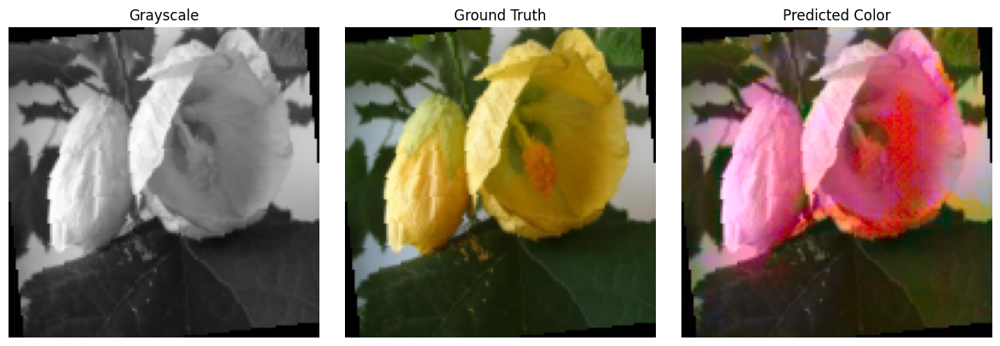

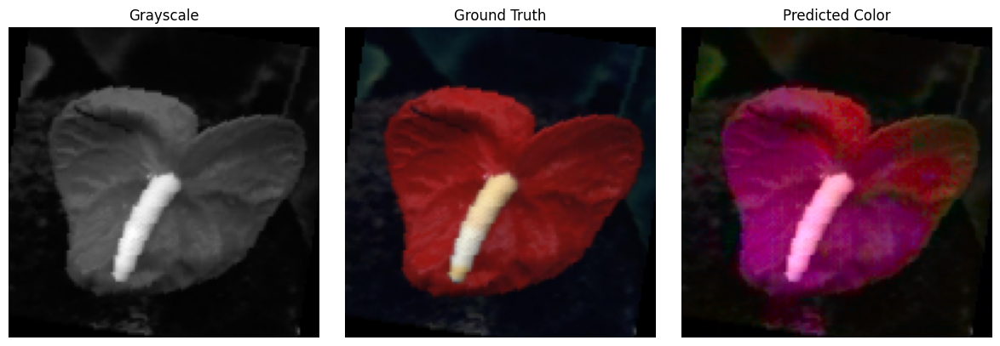

/tmp/ipython-input-13-3083489067.py:14: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab)


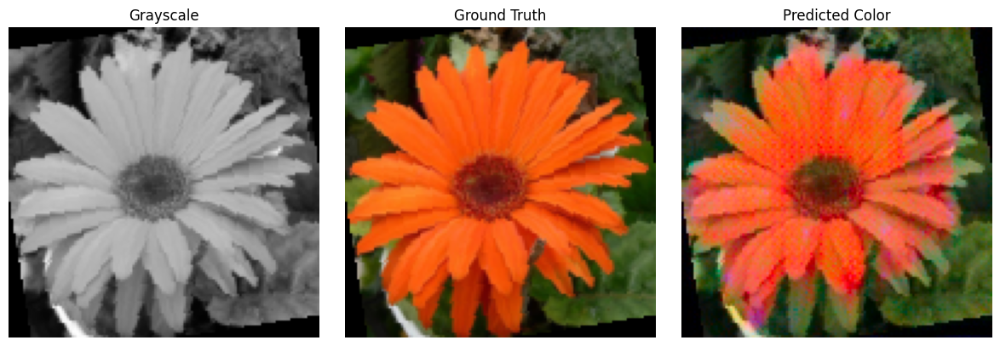

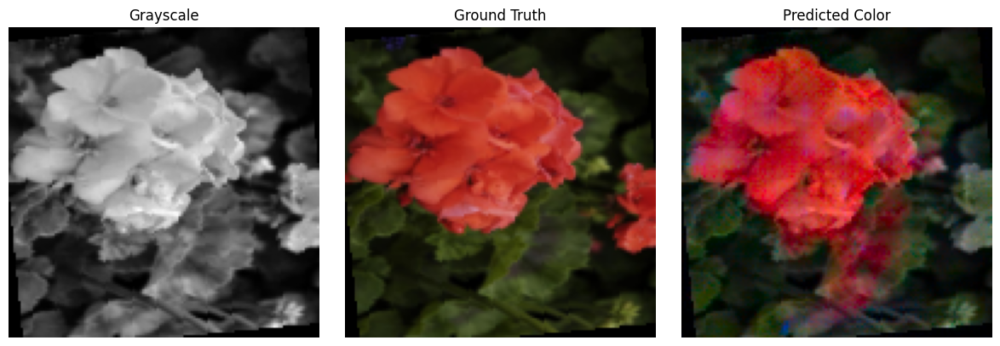

/tmp/ipython-input-13-3083489067.py:14: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 5 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab)


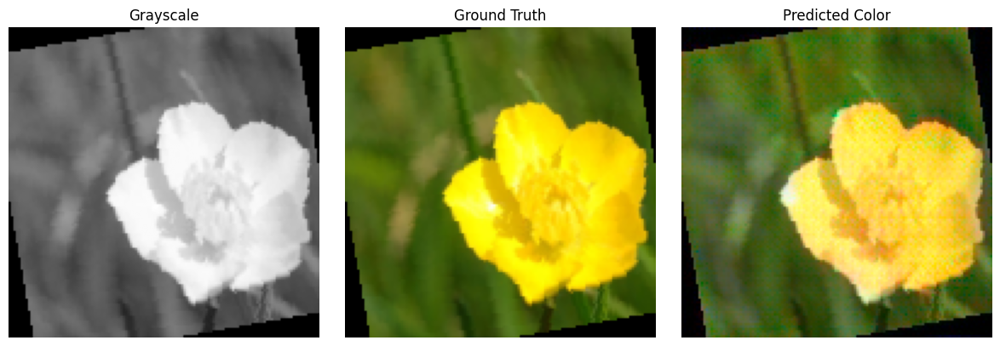

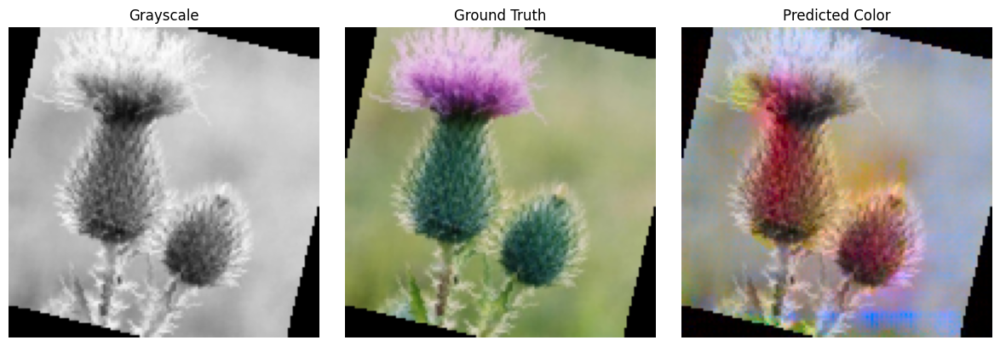

/tmp/ipython-input-13-3083489067.py:14: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 4 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab)


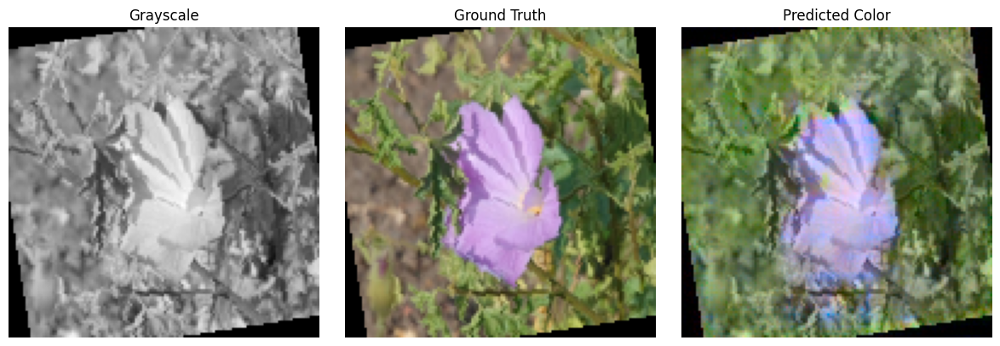

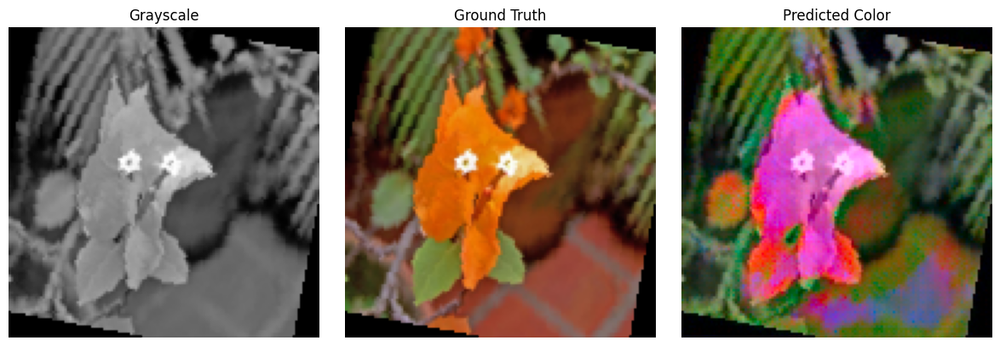

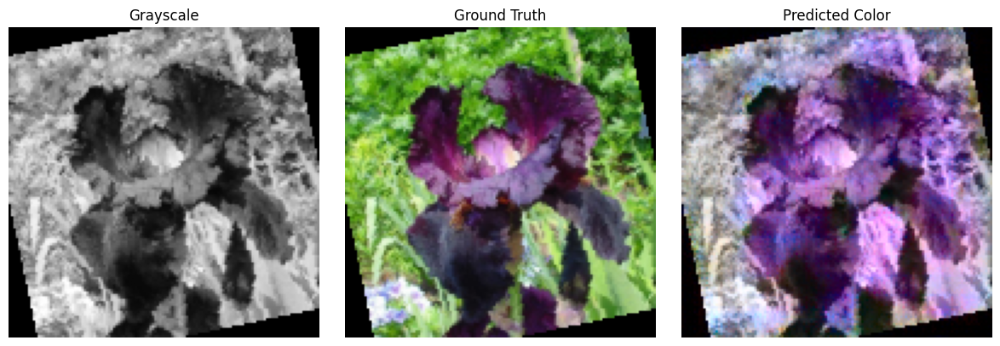

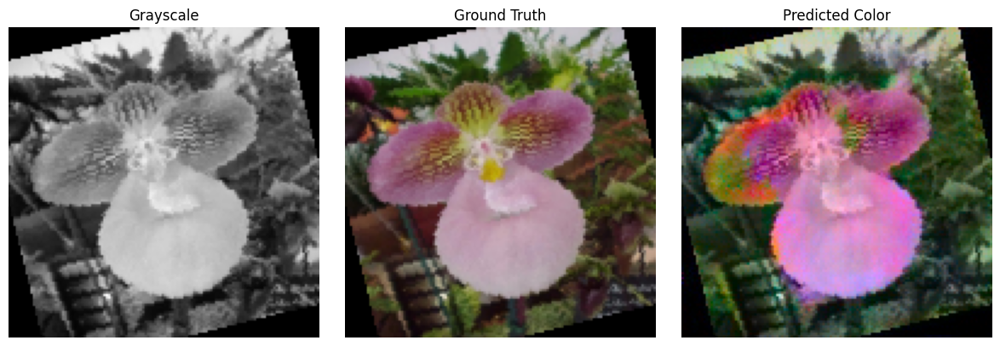

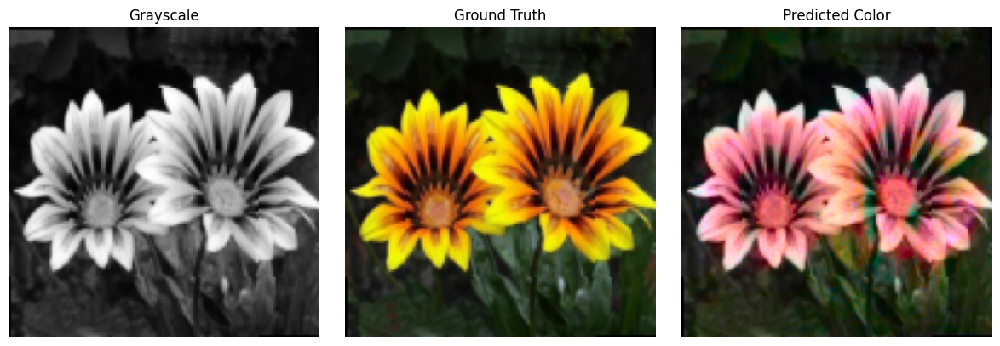

/tmp/ipython-input-13-3083489067.py:14: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 3 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab)


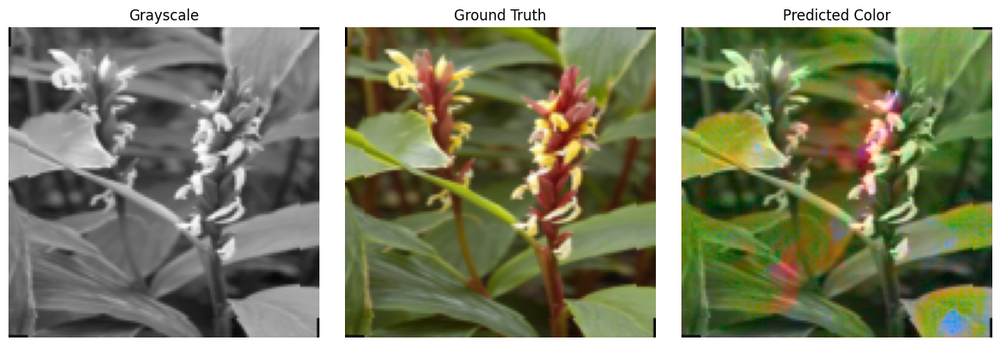

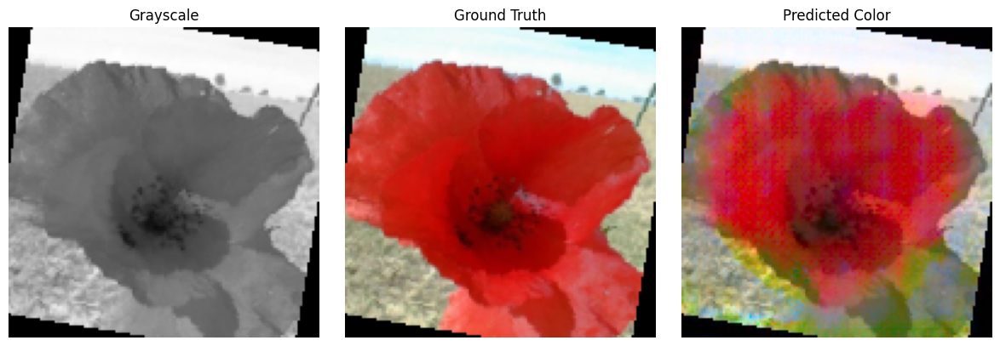

/tmp/ipython-input-13-3083489067.py:14: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 7 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab)


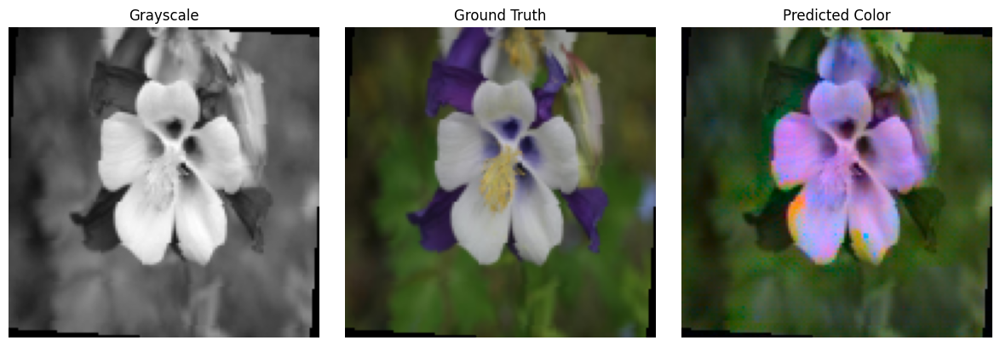

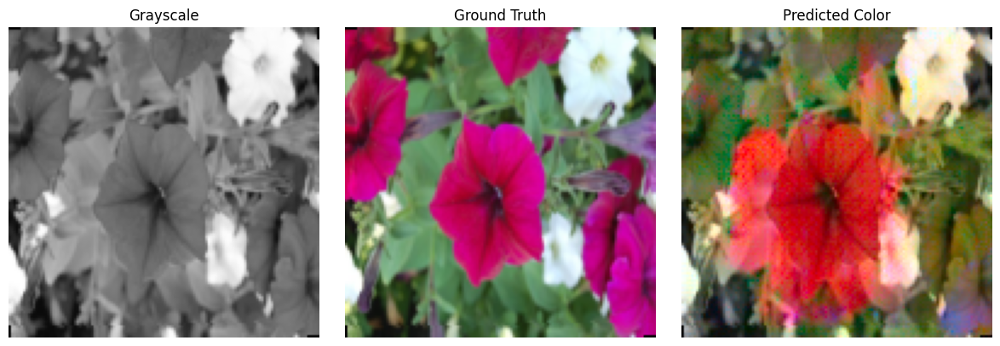

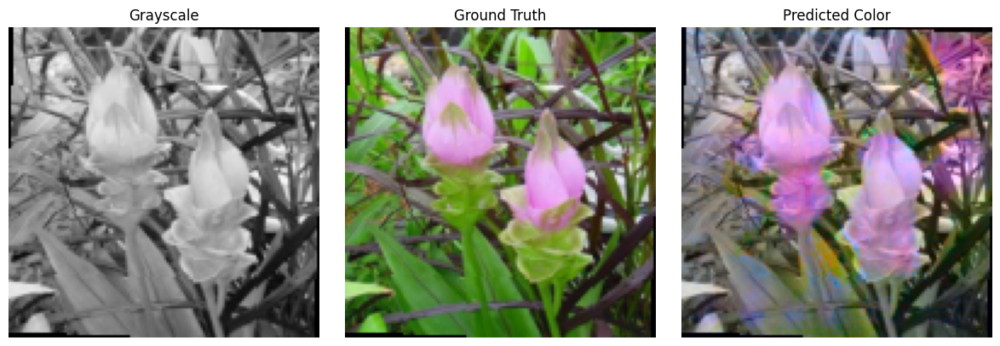

/tmp/ipython-input-13-3083489067.py:14: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 8 negative Z values that have been clipped to zero
  rgb = lab2rgb(lab)


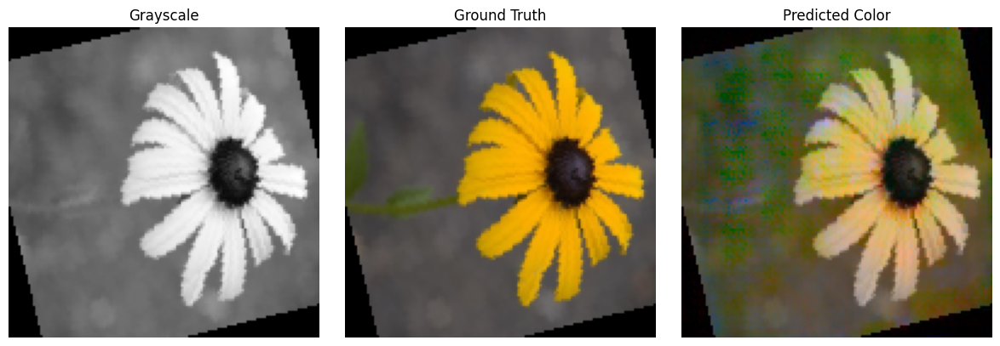

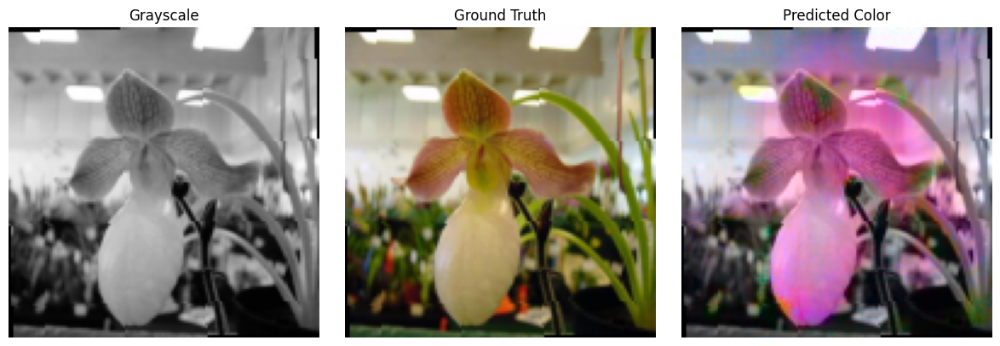

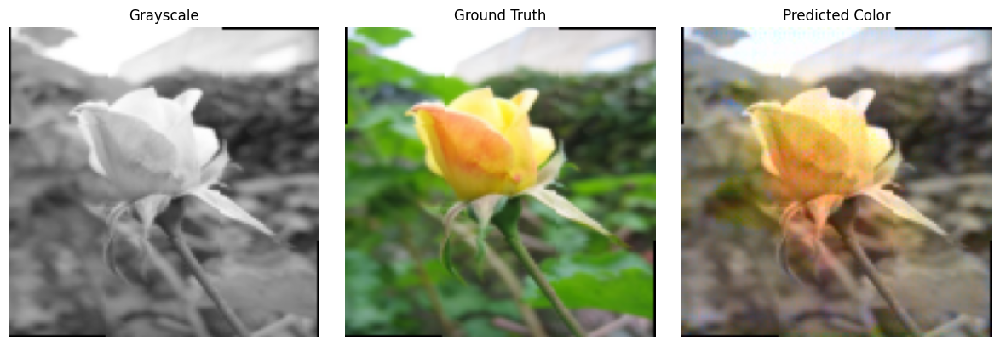

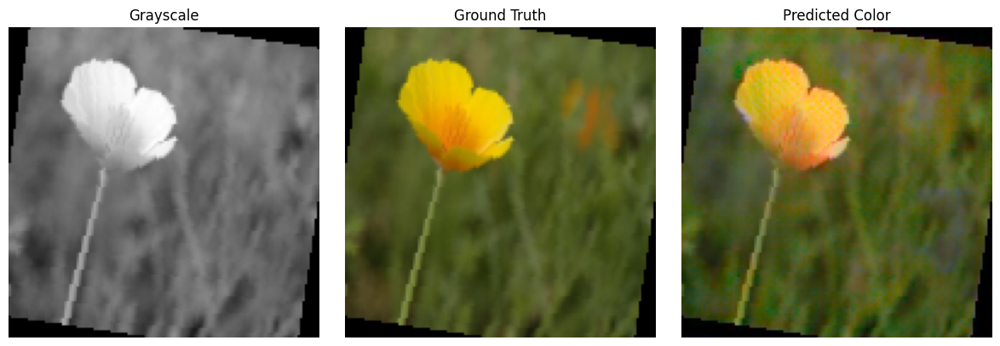

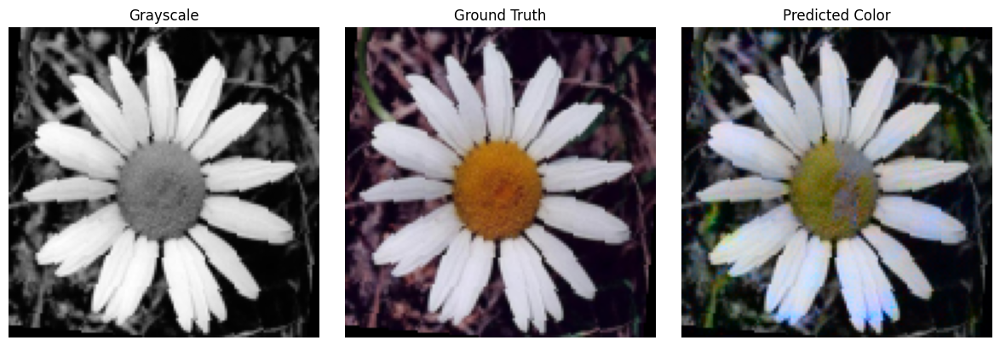

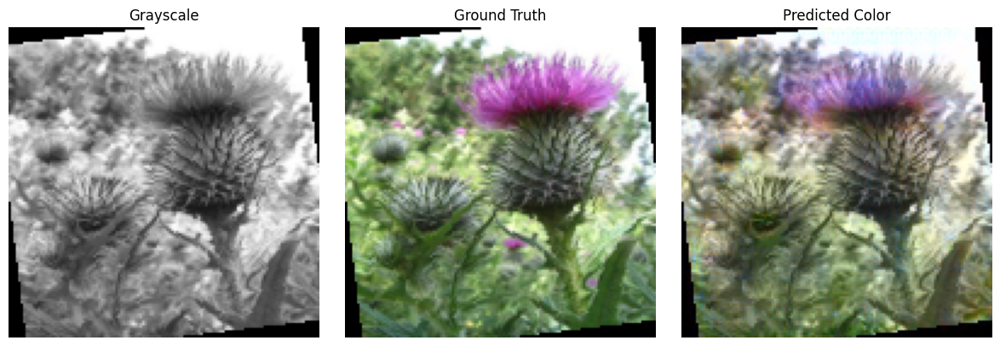

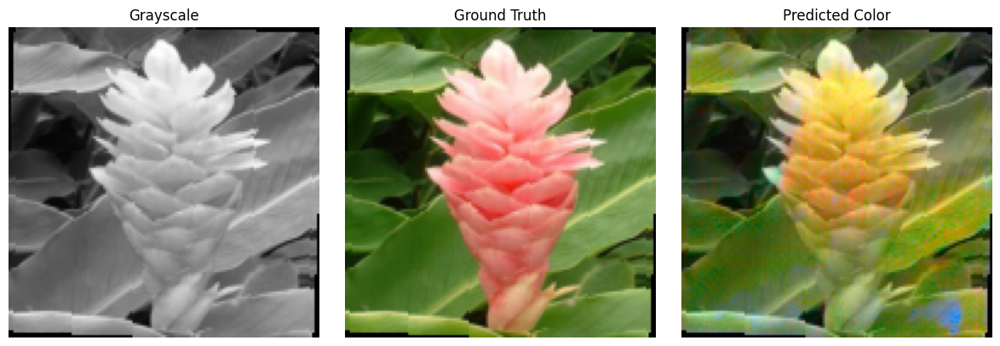

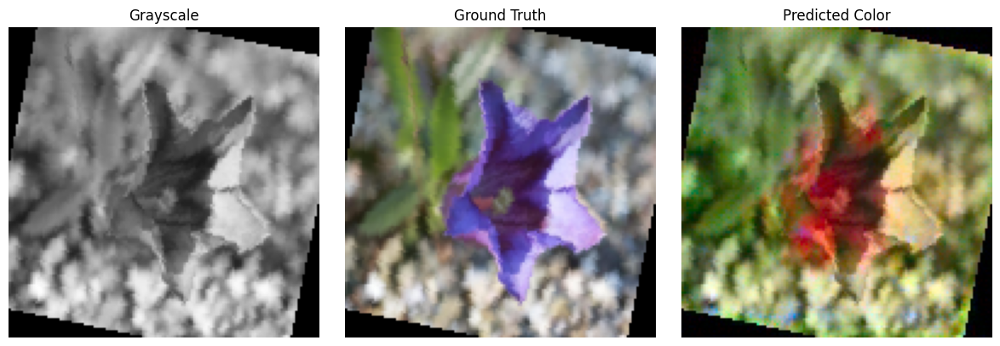

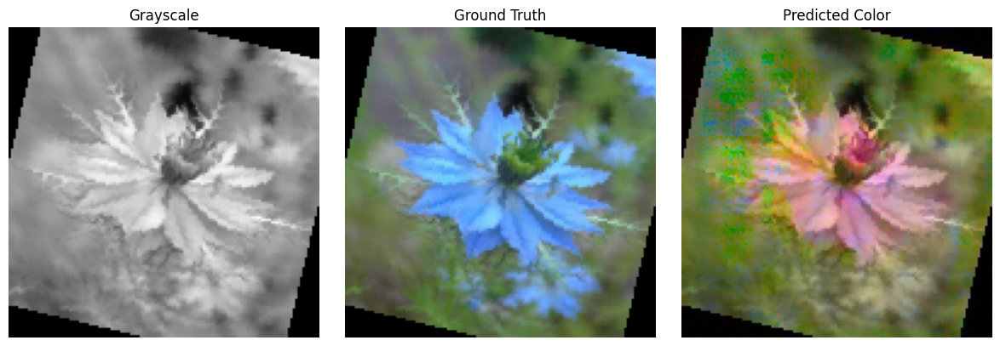

In [ ]:
# Visualize results after training
visualize_results(generator, val_loader, num_images=5)